<a href="https://colab.research.google.com/github/donib-irakihda/dog-breed-identification/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# !unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision/" 

Streaming output truncated to the last 5000 lines.
  inflating: drive/MyDrive/Dog Vision/train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: drive/MyDrive/Dog Vision/train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: drive/MyDrive/Dog Vision/train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: drive/MyDrive/Dog Vision/train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: drive/MyDrive/Dog Vision/train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: drive/MyDrive/Dog Vision/train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: drive/MyDrive/Dog Vision/train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: drive/MyDrive/Dog Vision/train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: drive/MyDrive/Dog Vision/train/83fad0718581a696132c96c166472627.jpg  
  inflating: drive/MyDrive/Dog Vision/train/83fbbcc9a612e3f712b1ba199da61f20.jpg  
  inflating: drive/MyDrive/Dog Vision/train/8403d8936430c2f05ab7d74d23c2c0cb.jpg  
  inflating: drive/MyDrive/Dog Visio

# End-to-end multi-class Dog Breed Classification

In [ ]:
# Import necessary tools into colab

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF Hub Version:", hub.__version__)

# Check for GPU availabilty
print("GPU", "available (YESSSSS!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version: 2.7.0
TF Hub Version: 0.12.0
GPU available (YESSSSS!!!!)


## Getting our data ready (turning data into Tensors)

In [ ]:
# Check out the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     9a0bd02ffe451fc028e8e9a4ecef22d4  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


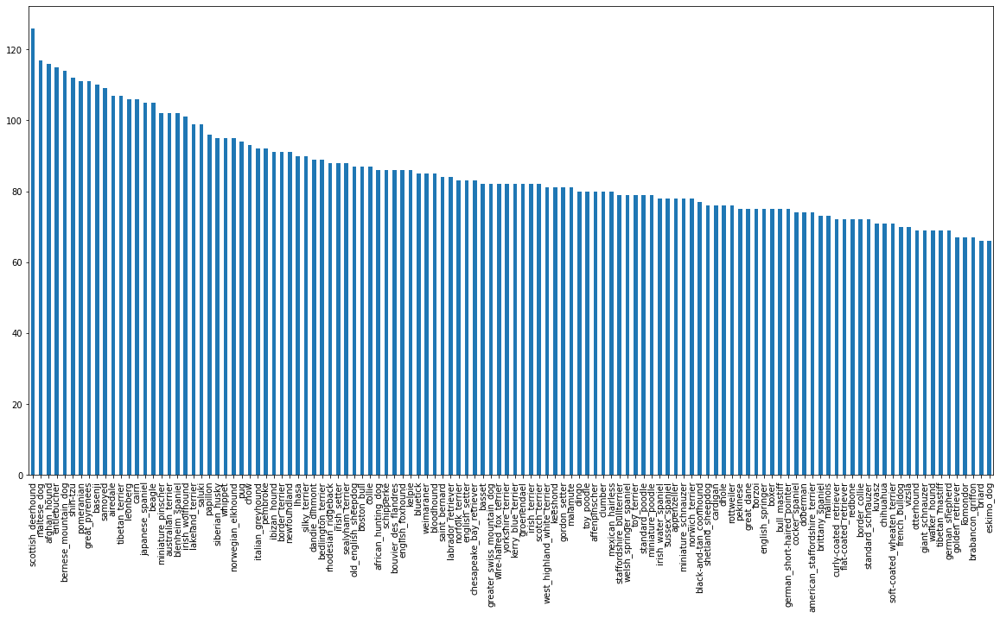

In [ ]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

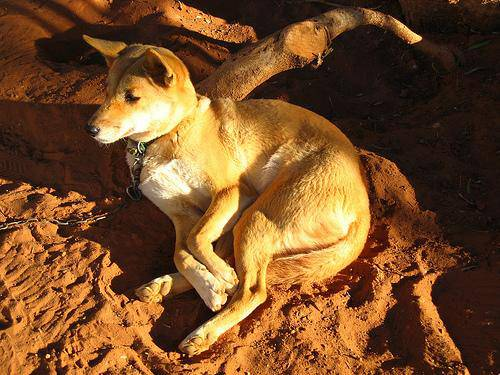

In [ ]:
# Lets view an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from image IDs
filenames = ["drive/MyDrive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first ten
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train/")) == len(filenames):
  print("Filenames match actual amount of files!! Proceed.")
else:
  print("Filenames do not match actual amount of files, check the target directory.")

Filenames match actual amount of files!! Proceed.


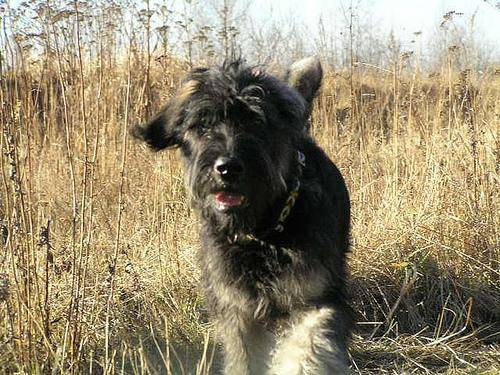

In [ ]:
Image(filenames[36])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

In [ ]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels) # does samething
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# Check if no of labels matches yhe no of filenames
if len(labels) == len(filenames):
  print("same!!")
else:
  print("not same")

same!!


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every labels into booleans array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# Example of turning boolean into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where sample occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

### Creating our own validation set

In [ ]:
# Setup x and y variables
x = filenames
y = boolean_labels

In [ ]:
# Set number of images to use for experimeneting (~1000)
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Split data into train and validation
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(x_train), len(y_train), len(x_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
x_train[:2], y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, Fal

## Preprocessing Images (turning images into tensors)

In [ ]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

In [ ]:
 # Define image size
IMG_SIZE = 224

# Create a function for prepricessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)

  # Turn the jpg image into numerical Tensor with 3 colour channels (RGB)
  image = tf.image.decode_jpeg(image, channels=3)

  # Convert the color channel values to 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches

In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label, processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [ ]:
(process_image(x[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
# Define the batch size(32)
BATCH_SIZE = 32

# Create a function to tuen data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if its training data but doesnot shuffle if its a validation data.
  Also accepts test data as input (no labels)
  """
  # If the data is test dataset, we dont have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),  # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  # If the data is training dataset
  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(y)))
    # Shuffling pathnames and labels 
    data = data.shuffle(buffer_size=len(x))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch


In [ ]:
# Create training and validation data batches
train_data = create_data_batches(x_train, y_train)
val_data = create_data_batches(x_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Checkout the different attributes of our batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing omages in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

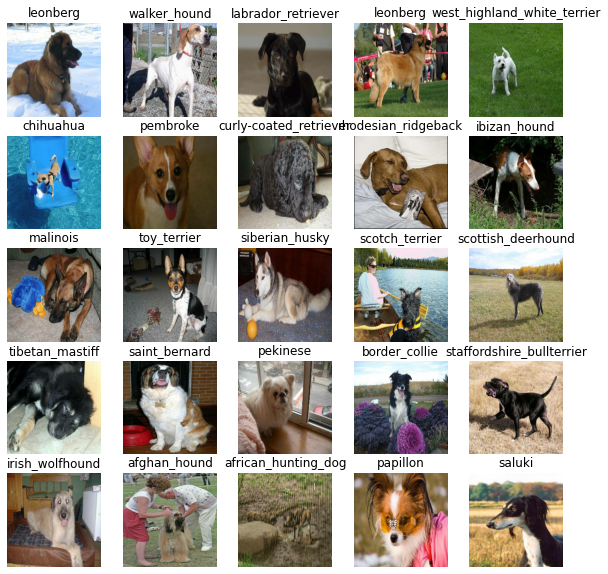

In [ ]:
# Visualize the data in training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

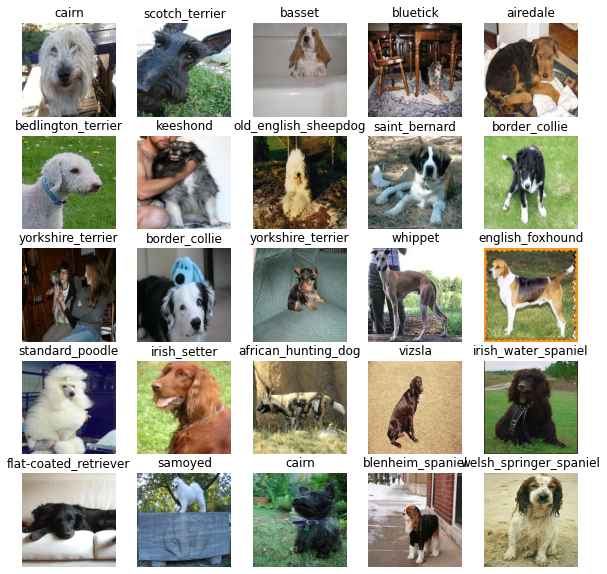

In [ ]:
# Visualize the data in validation batch
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, color channels

# Setup the output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with: ", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                   activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks

### TensorBoard Callback

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Dog Vision/logs/",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callbacks

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on subset of data)

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Check to make sure we're still running on GPU
print("GPU", "available (YESSS!!!)" if tf.config.list_physical_devices("GPU") else "not availabele :(")

GPU available (YESSS!!!)


In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create a new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  
  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 10s 201ms/step - loss: 4.4788 - accuracy: 0.0913 - val_loss: 3.4175 - val_accuracy: 0.2900
Epoch 2/100
25/25 [==============================] - 5s 200ms/step - loss: 1.5613 - accuracy: 0.7125 - val_loss: 2.2057 - val_accuracy: 0.4800
Epoch 3/100
25/25 [==============================] - 5s 202ms/step - loss: 0.5431 - accuracy: 0.9425 - val_loss: 1.6749 - val_accuracy: 0.5850
Epoch 4/100
25/25 [==============================] - 5s 189ms/step - loss: 0.2447 - accuracy: 0.9875 - val_loss: 1.5059 - val_accuracy: 0.6250
Epoch 5/100
25/25 [==============================] - 5s 189ms/step - loss: 0.1430 - accuracy: 0.9962 - val_loss: 1.4305 - val_accuracy: 0.6450
Epoch 6/100
25/25 [==============================] - 5s 201ms/step - loss: 0.0988 - accuracy: 1.0000 - val_loss: 1.3745 - val_accuracy: 0.6450
Epoch 7/100
25/25 [============================

## Checking the tensorboard logs

In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

Reusing TensorBoard on port 6006 (pid 589), started 0:09:11 ago. (Use '!kill 589' to kill it.)

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
# Make predictions on validation data (not used to train data)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 4s 197ms/step


array([[0.04053805, 0.00167203, 0.00830592, ..., 0.00300046, 0.02263552,
        0.00159553],
       [0.00206117, 0.04797202, 0.00528313, ..., 0.00658163, 0.00798496,
        0.01127129],
       [0.00140475, 0.00237785, 0.00127388, ..., 0.00093819, 0.00215158,
        0.00106024],
       ...,
       [0.00118122, 0.00019818, 0.002214  , ..., 0.0006706 , 0.00086599,
        0.00382719],
       [0.01679103, 0.00246154, 0.0061004 , ..., 0.0026112 , 0.00488106,
        0.00742027],
       [0.01176471, 0.00256091, 0.00058778, ..., 0.00440834, 0.00607241,
        0.00490205]], dtype=float32)

In [ ]:
np.sum(predictions[1])

1.0000001

In [ ]:
# First prediction
index = 199
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[2.97408696e-04 1.16223646e-05 7.63760239e-04 8.35472238e-05
 1.27874373e-03 1.24815762e-01 5.44549315e-04 7.69323781e-02
 2.07845820e-04 8.80745007e-04 5.71962046e-05 2.76988707e-02
 3.02624918e-04 1.15937705e-03 7.33729903e-05 2.54978921e-04
 4.51608524e-02 9.05111898e-04 1.18194101e-03 2.57468335e-02
 2.59463959e-05 1.01300306e-04 1.01335044e-03 4.13297748e-05
 2.21213268e-04 3.24174562e-06 1.48937386e-03 3.76808941e-01
 6.90044020e-04 3.22359992e-04 1.90250539e-05 9.13852491e-05
 1.57515933e-05 1.17779799e-01 4.30448672e-05 4.13862945e-05
 2.17001856e-04 3.82490485e-04 3.96966236e-04 5.53785241e-04
 5.65498660e-04 6.75324467e-04 2.80905887e-02 3.31173418e-03
 2.46030674e-03 5.79558309e-06 5.21336216e-04 3.92996211e-04
 1.01640071e-04 2.04514308e-05 5.35212108e-04 3.77527576e-05
 2.96097249e-04 4.81687710e-02 6.61087513e-04 1.63300463e-03
 2.54587485e-05 2.50548939e-04 5.74938203e-05 1.12679256e-04
 6.89737382e-04 5.16556203e-03 2.92433742e-05 4.26641200e-03
 4.05876723e-04 3.282191

In [ ]:
# Turn prediction probablities into their respective label
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probablities into label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[36])
pred_label

'pomeranian'

In [ ]:
val_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate array of images and labels.
  """
  images = []
  labels =[]

  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data set
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_labels[0])

'affenpinscher'

In [ ]:
# Visualize the model predictions

def plot_pred(prediction_probabilities, labels, images, n=0):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probality of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)


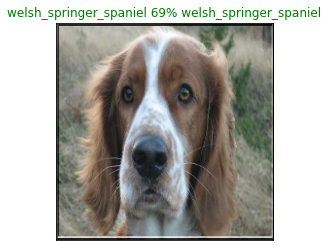

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=36)

### Plot the top 10 prediction probablity values and labels, coloring the true green label

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plot the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indices
  top_10_pred_indices = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indices]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indices]

  # Setup a plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  
  # Change the color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass


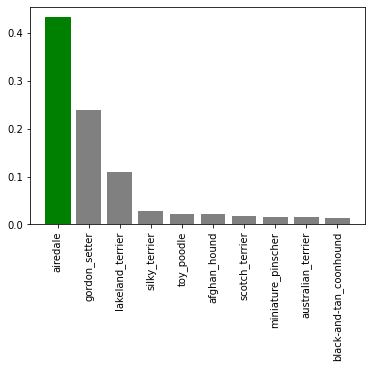

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=69)

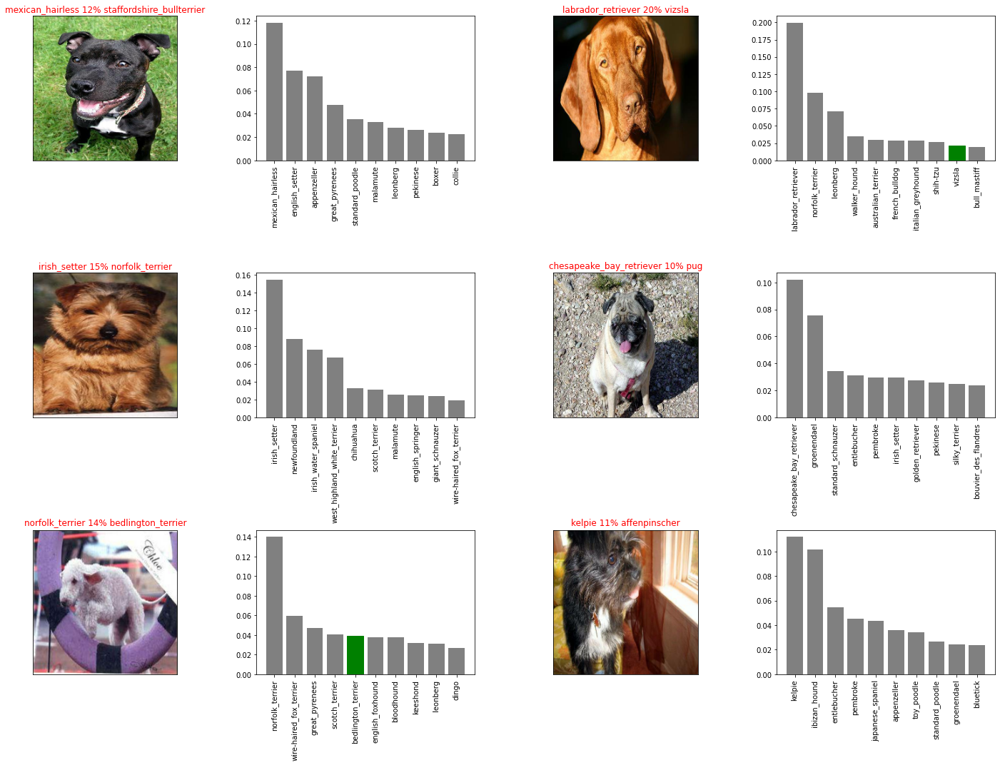

In [ ]:
# Let's check out few predictions and their different values
i_multiplier = 50
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a trained model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix(string)
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Ym%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # Save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from specified path.
  """
  print(f"Loading a model from {model_path}...")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/2022m29-11231643455428-1000-images-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/2022m29-11231643455428-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model("drive/MyDrive/Dog Vision/models/2022m29-11231643455428-1000-images-mobilenetv2-Adam.h5")

Loading a model from drive/MyDrive/Dog Vision/models/2022m29-11231643455428-1000-images-mobilenetv2-Adam.h5...


In [ ]:
# evaluate the presaved model
model.evaluate(val_data)

7/7 [==============================] - 1s 173ms/step - loss: 1.2050 - accuracy: 0.7050


[1.2050211429595947, 0.7049999833106995]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 3s 162ms/step - loss: 1.2050 - accuracy: 0.7050


[1.2050211429595947, 0.7049999833106995]

## Training a big dog model on the full data

In [ ]:
len(x), len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full dataset
full_data = create_data_batches(x, y)

Creating training data batches...


In [ ]:
full_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

Following code will take a lot of time

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 971s 3s/step - loss: 1.3349 - accuracy: 0.6699
Epoch 2/100
320/320 [==============================] - 51s 159ms/step - loss: 0.4000 - accuracy: 0.8815
Epoch 3/100
320/320 [==============================] - 52s 163ms/step - loss: 0.2384 - accuracy: 0.9340
Epoch 4/100
320/320 [==============================] - 52s 162ms/step - loss: 0.1552 - accuracy: 0.9627
Epoch 5/100
320/320 [==============================] - 52s 162ms/step - loss: 0.1050 - accuracy: 0.9802
Epoch 6/100
320/320 [==============================] - 52s 164ms/step - loss: 0.0764 - accuracy: 0.9875
Epoch 7/100
320/320 [==============================] - 53s 164ms/step - loss: 0.0595 - accuracy: 0.9915
Epoch 8/100
320/320 [==============================] - 52s 163ms/step - loss: 0.0457 - accuracy: 0.9953
Epoch 9/100
320/320 [==============================] - 52s 162ms/step - loss: 0.0392 - accuracy: 0.9958
Epoch 10/100
320/320 [==============================] - 53s 166ms/

In [ ]:
save_model(full_model, suffix="full-model-set-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/2022m29-12171643458658-full-model-set-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog Vision/models/2022m29-12171643458658-full-model-set-mobilenetv2-Adam.h5'

In [ ]:
loaded_full_model = load_model("drive/MyDrive/Dog Vision/models/2022m29-12171643458658-full-model-set-mobilenetv2-Adam.h5")

Loading a model from drive/MyDrive/Dog Vision/models/2022m29-12171643458658-full-model-set-mobilenetv2-Adam.h5...


## Making predictions on test data test

In [ ]:
# Load test image filenames
import os
test_path = "drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/test/e7ce78e874945f182a4f5149aa505b09.jpg',
 'drive/MyDrive/Dog Vision/test/e52a4321a8cb0dd3bcc8f4a68b75eee7.jpg',
 'drive/MyDrive/Dog Vision/test/dcdffa00518844bd21499db49979f9c8.jpg',
 'drive/MyDrive/Dog Vision/test/df2b5cee4b3d8a3cb893b668df16d572.jpg',
 'drive/MyDrive/Dog Vision/test/e000b7b3b37659a771d0151dc453bc0a.jpg',
 'drive/MyDrive/Dog Vision/test/de5496c6b58f66ab890ab24087d9e220.jpg',
 'drive/MyDrive/Dog Vision/test/e265af5e8f446888c6e7ec31f803d63e.jpg',
 'drive/MyDrive/Dog Vision/test/e6a0eeb3e82e14eb812d9ef22383ec11.jpg',
 'drive/MyDrive/Dog Vision/test/dfac7db18136057f5d1730c0055f875c.jpg',
 'drive/MyDrive/Dog Vision/test/e1d31decdd6521df89e59d181f0c73ed.jpg']

In [ ]:
# Create a test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [ ]:
# Make predictions on test data batches using loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                     verbose=1)

324/324 [==============================] - 103s 317ms/step


In [ ]:
# Save predictions (NumPy array) to csv file
np.savetxt("drive/MyDrive/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
test_predictions = np.loadtxt("drive/MyDrive/Dog Vision/preds_array.csv", delimiter=",")

In [ ]:
test_predictions[:10]

array([[3.46392738e-07, 3.75722342e-10, 2.42508431e-05, ...,
        8.55109228e-09, 1.79551651e-09, 1.24738688e-06],
       [3.36070138e-06, 1.68565952e-04, 2.92430613e-08, ...,
        4.28491420e-09, 1.50018735e-08, 9.63648883e-11],
       [1.43317885e-10, 2.48382977e-12, 2.70580894e-13, ...,
        2.87412494e-08, 1.77776975e-08, 3.37796609e-12],
       ...,
       [1.84264849e-07, 1.75566850e-09, 8.62749072e-09, ...,
        4.92911845e-09, 1.26618545e-06, 2.22549417e-07],
       [8.94438950e-12, 3.22270171e-05, 1.79083681e-09, ...,
        3.61417101e-08, 5.12141085e-09, 1.32416256e-09],
       [5.63391667e-10, 2.29082059e-10, 9.31897337e-11, ...,
        1.60909980e-10, 1.61210420e-10, 8.21593105e-09]])

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle

In [ ]:
list(unique_breeds)

['affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier',
 'appenzeller',
 'australian_terrier',
 'basenji',
 'basset',
 'beagle',
 'bedlington_terrier',
 'bernese_mountain_dog',
 'black-and-tan_coonhound',
 'blenheim_spaniel',
 'bloodhound',
 'bluetick',
 'border_collie',
 'border_terrier',
 'borzoi',
 'boston_bull',
 'bouvier_des_flandres',
 'boxer',
 'brabancon_griffon',
 'briard',
 'brittany_spaniel',
 'bull_mastiff',
 'cairn',
 'cardigan',
 'chesapeake_bay_retriever',
 'chihuahua',
 'chow',
 'clumber',
 'cocker_spaniel',
 'collie',
 'curly-coated_retriever',
 'dandie_dinmont',
 'dhole',
 'dingo',
 'doberman',
 'english_foxhound',
 'english_setter',
 'english_springer',
 'entlebucher',
 'eskimo_dog',
 'flat-coated_retriever',
 'french_bulldog',
 'german_shepherd',
 'german_short-haired_pointer',
 'giant_schnauzer',
 'golden_retriever',
 'gordon_setter',
 'great_dane',
 'great_pyrenees',
 'greater_swiss_mountain_dog',
 'groenendael',


In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns= ["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ids to prediction DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e7ce78e874945f182a4f5149aa505b09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e52a4321a8cb0dd3bcc8f4a68b75eee7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,dcdffa00518844bd21499db49979f9c8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,df2b5cee4b3d8a3cb893b668df16d572,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e000b7b3b37659a771d0151dc453bc0a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probablities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e7ce78e874945f182a4f5149aa505b09,3.46393e-07,3.75722e-10,2.42508e-05,6.88494e-13,2.98698e-09,3.49071e-07,7.53223e-09,1.2354e-08,9.3184e-12,5.81086e-12,1.80435e-09,9.67782e-09,2.49795e-09,2.64316e-10,7.18405e-09,3.25782e-09,4.02623e-06,7.80012e-10,6.78695e-11,1.6025e-06,9.18119e-09,1.14715e-12,1.6306e-07,6.19692e-09,3.22377e-07,1.05736e-11,6.93728e-10,7.31584e-07,6.33562e-09,1.72228e-05,1.17506e-08,2.00214e-08,4.50326e-09,6.54051e-07,5.47116e-06,4.17818e-09,2.3296e-07,9.00544e-07,1.48914e-08,...,1.71133e-05,5.7021e-07,1.34367e-11,4.60188e-10,6.05337e-07,6.51784e-10,2.70039e-07,2.42877e-06,3.6367e-08,3.10297e-07,2.45831e-12,6.51899e-10,3.37812e-11,1.52019e-10,1.40959e-08,0.773005,8.46282e-06,2.29756e-07,7.88102e-09,1.75272e-08,3.1973e-09,3.35479e-06,2.47482e-11,2.42606e-09,3.78242e-07,4.92928e-07,4.61526e-10,5.03051e-07,2.39264e-07,6.49519e-08,1.05781e-07,1.7778e-08,3.13734e-09,1.38318e-11,2.49136e-08,4.89155e-11,4.35877e-09,8.55109e-09,1.79552e-09,1.24739e-06
1,e52a4321a8cb0dd3bcc8f4a68b75eee7,3.3607e-06,0.000168566,2.92431e-08,6.00762e-09,1.48486e-09,5.48845e-08,2.02174e-07,1.93627e-09,5.12395e-08,6.3324e-11,6.8562e-09,6.22033e-06,2.67859e-07,2.82935e-08,7.31452e-06,4.36141e-07,0.000230505,1.31757e-10,2.61587e-07,1.65528e-09,9.23363e-08,6.19627e-10,3.55569e-10,4.40759e-05,2.05063e-09,1.35187e-05,2.34825e-10,2.80412e-09,9.29915e-08,5.07569e-11,0.000283587,6.22659e-07,6.68465e-07,3.55763e-06,3.201e-07,2.88973e-09,2.00446e-06,2.3892e-08,1.62338e-09,...,1.00353e-08,1.66899e-08,7.16487e-07,4.3343e-07,9.45708e-08,4.77592e-05,3.38817e-09,6.03185e-10,3.50613e-08,2.40858e-08,1.542e-07,2.03569e-07,0.000119793,6.99803e-06,1.87427e-06,1.06645e-07,1.60642e-07,1.00938e-06,1.15576e-08,7.13471e-07,5.36957e-07,1.52526e-10,2.61146e-07,2.41744e-09,1.44591e-08,7.33662e-06,5.31807e-08,1.08566e-06,0.91341,0.000107914,4.93884e-08,2.9795e-09,1.10186e-09,2.62478e-08,9.69927e-08,6.78573e-12,1.14843e-09,4.28491e-09,1.50019e-08,9.63649e-11
2,dcdffa00518844bd21499db49979f9c8,1.43318e-10,2.48383e-12,2.70581e-13,3.19482e-11,1.01593e-06,3.58695e-05,7.11126e-09,0.999781,9.17687e-09,1.55603e-10,9.45234e-11,1.14253e-11,3.66267e-12,2.94688e-09,2.24256e-10,3.83559e-10,6.26396e-12,3.008e-10,2.36035e-13,7.09496e-09,3.31374e-13,7.93014e-09,2.05092e-07,1.0811e-14,4.65966e-11,3.95943e-11,1.12691e-12,3.57604e-10,1.07809e-08,6.56601e-08,1.15969e-08,3.27427e-10,6.02743e-10,2.90997e-10,1.58147e-12,4.21776e-10,3.50692e-09,2.04595e-10,1.67716e-10,...,1.02415e-08,3.7437e-09,7.62825e-13,1.58696e-13,8.20807e-08,2.80255e-09,3.17951e-08,7.4209e-10,1.30219e-10,0.000160876,1.54028e-09,5.36207e-12,1.85904e-12,9.23446e-12,2.13125e-07,2.71033e-09,6.56476e-12,2.45485e-12,5.76568e-11,1.66428e-10,7.60306e-09,2.17553e-09,1.23437e-09,3.47696e-10,1.48881e-07,1.73561e-05,7.45038e-11,7.3704e-11,4.97809e-10,1.05912e-09,4.55386e-08,4.83023e-09,1.08398e-08,4.92731e-12,1.86384e-12,8.63803e-10,2.7967e-11,2.

In [ ]:
# save our prediction dataframe to csv for kaggle submission
preds_df.to_csv("drive/MyDrive/Dog Vision/full_model_predictions_submission_1_mobilenetv2.csv",
                index=False)

## Making predictions on custom images

In [ ]:
# Get custom image filepaths
custom_path = "drive/MyDrive/Dog Vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/MyDrive/Dog Vision/my-dog-photos/1643457108123.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/1643463673334.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/download (2).jpeg',
 'drive/MyDrive/Dog Vision/my-dog-photos/images.jpeg',
 'drive/MyDrive/Dog Vision/my-dog-photos/download (3).jpeg',
 'drive/MyDrive/Dog Vision/my-dog-photos/download (1).jpeg',
 'drive/MyDrive/Dog Vision/my-dog-photos/download.jpeg',
 'drive/MyDrive/Dog Vision/my-dog-photos/Screenshot_2022-01-29-19-51-54-103_com.miui.gallery.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/IMG_20220129_195318.jpg']

In [ ]:
# Turn custom images into batch dataset
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [ ]:
# Make predictions
custom_preds = loaded_full_model.predict(custom_data)

In [ ]:
custom_preds.shape

(9, 120)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['labrador_retriever',
 'rhodesian_ridgeback',
 'tibetan_mastiff',
 'redbone',
 'labrador_retriever',
 'brittany_spaniel',
 'golden_retriever',
 'pomeranian',
 'boxer']

In [ ]:
# Get custom images 
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

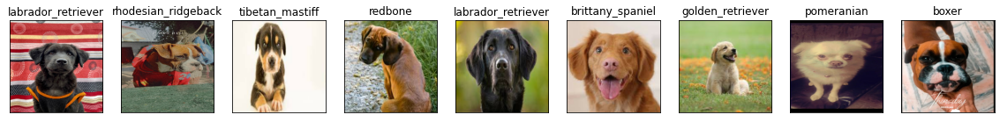

In [ ]:
# Check custom predictions
plt.figure(figsize=(20, 20))
for i, image in enumerate(custom_images):
  plt.subplot(1, 9, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)